## Regression

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression


In [2]:
df = pd.read_csv('ComputerHardware.csv')

In [3]:
df.head(10)

,Unnamed: 0,VendorName,ModelName,MYCT,MMIN,MMAX,CACH,CHMIN,CHMAX,PRP
0,0,adviser,32/60,125,256,6000,256,16,128,198
1,1,amdahl,470v/7,29,8000,32000,32,8,32,269
2,2,amdahl,470v/7a,29,8000,32000,32,8,32,220
3,3,amdahl,470v/7b,29,8000,32000,32,8,32,172
4,4,amdahl,470v/7c,29,8000,16000,32,8,16,132
5,5,amdahl,470v/b,26,8000,32000,64,8,32,318
6,6,amdahl,580-5840,23,16000,32000,64,16,32,367
7,7,amdahl,580-5850,23,16000,32000,64,16,32,489
8,8,amdahl,580-5860,23,16000,64000,64,16,32,636
9,9,amdahl,580-5880,23,32000,64000,128,32,64,1144


In [4]:
df.isna().sum()

Unnamed: 0    0
VendorName    0
ModelName     0
MYCT          0
MMIN          0
MMAX          0
CACH          0
CHMIN         0
CHMAX         0
PRP           0
dtype: int64

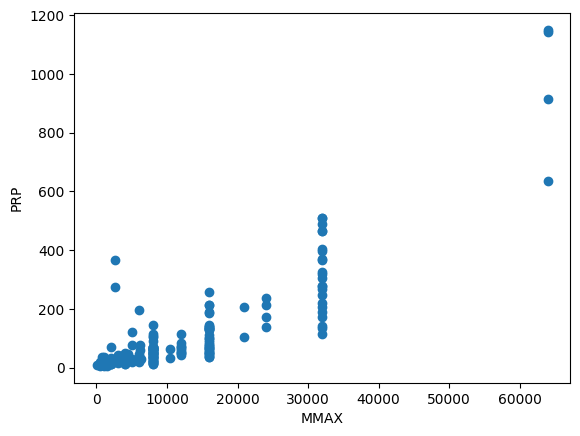

In [5]:
plt.scatter(df['MMAX'],df['PRP'])
plt.xlabel('MMAX')
plt.ylabel('PRP')
plt.show()

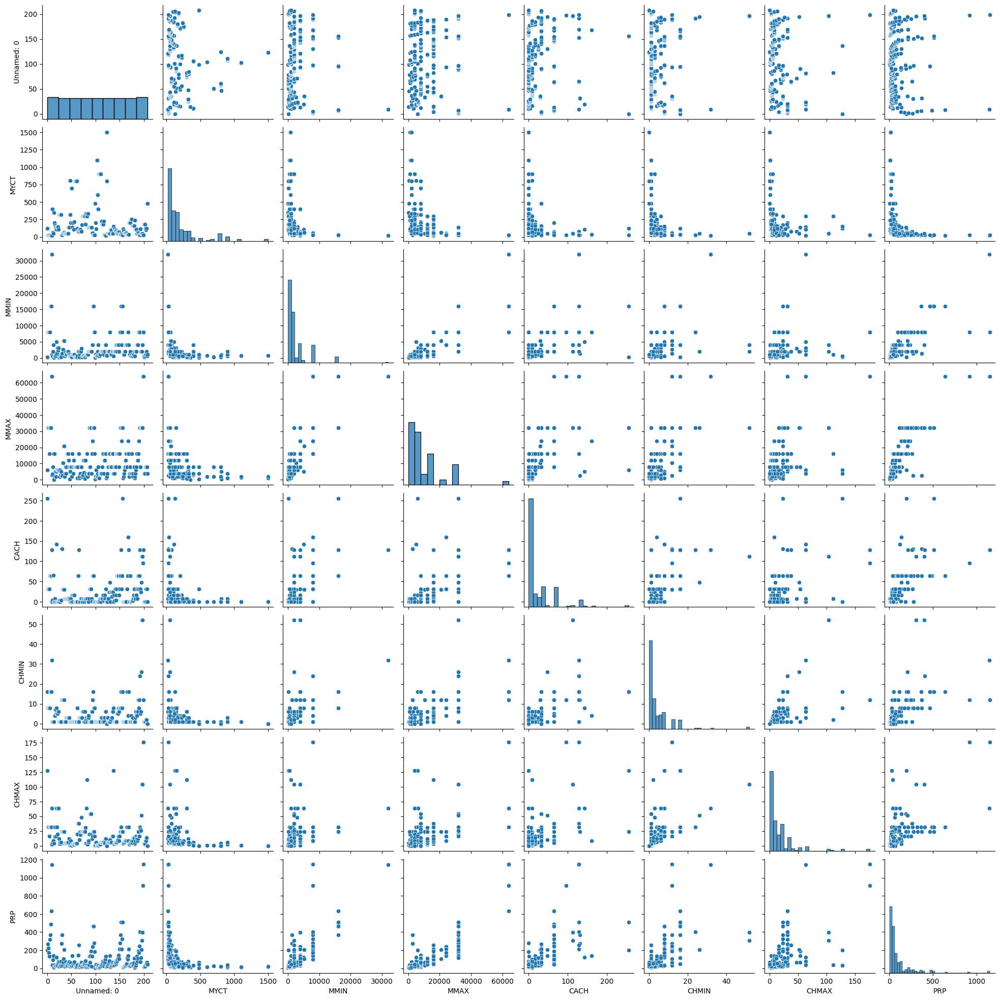

In [6]:
sns.pairplot(df)

In [7]:
X = df[['MMAX']]
y = df[['PRP']]

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

In [8]:
lr = LinearRegression()
lr.fit(X_train,y_train)
lr

LinearRegression()

In [9]:
print('Intercept: ', lr.intercept_)
print('Coef: ', lr.coef_)

Intercept:  [-18.44163019]
Coef:  [[0.01007558]]


In [10]:
y_pred = lr.predict(X_test)
prp = pd.DataFrame({'Actual PRP':y_test.values.flatten(),'Predicted PRP':y_pred.flatten()})
prp

,Actual PRP,Predicted PRP
0,22,21.860703
1,12,21.860703
2,64,62.163036
3,259,142.767702
4,18,21.860703
5,28,31.936286
6,1144,626.395698
7,49,102.465369
8,22,21.860703
9,214,223.372368


In [11]:
from sklearn import metrics

print("Mean Squared Error: ",metrics.mean_squared_error(y_test,y_pred))
print("Mean Absolute Error: ",metrics.mean_absolute_error(y_test,y_pred))
print("Root Mean Squared Error: ",np.sqrt(metrics.mean_squared_error(y_test,y_pred)))

Mean Squared Error:  17263.789238272766
Mean Absolute Error:  62.84762717632632
Root Mean Squared Error:  131.39173961201962


In [12]:
df2 = df.copy()


In [13]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df2['VendorName'] = label_encoder.fit_transform(df2['VendorName'])
df2['ModelName'] = label_encoder.fit_transform(df2['ModelName'])


In [14]:
X = df2.drop(columns=['PRP'])
y = df2[['PRP']]

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)


In [16]:
lr = LinearRegression()
model_mr = lr.fit(X_train,y_train)
model_mr

LinearRegression()

In [17]:
y_pred = model_mr.predict(X_test)

In [18]:
prp = pd.DataFrame({'Actual PRP':y_test.values.flatten(),'Predicted PRP':y_pred.flatten()})
prp

,Actual PRP,Predicted PRP
0,32,33.787725
1,24,7.411935
2,50,83.598029
3,53,76.435428
4,16,1.014810
5,1144,882.671099
6,32,-11.933336
7,16,-13.772014
8,208,259.558683
9,143,183.568582


In [19]:
print("Mean Absolute Error: ",metrics.mean_absolute_error(y_test,y_pred))
print("Mean Squared Error: ",metrics.mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error: ",np.sqrt(metrics.mean_absolute_error(y_test,y_pred)))

Mean Absolute Error:  56.565394914393565
Mean Squared Error:  8281.683691327215
Root Mean Squared Error:  7.52099693620424


## Logistic Regression and NB

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
import seaborn as sns
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,roc_curve,auc,confusion_matrix

In [21]:
df = pd.read_csv('framingham.csv')

In [22]:
df.head(10)

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0
5,0,43,2.0,0,0.0,0.0,0,1,0,228.0,180.0,110.0,30.30,77.0,99.0,0
6,0,63,1.0,0,0.0,0.0,0,0,0,205.0,138.0,71.0,33.11,60.0,85.0,1
7,0,45,2.0,1,20.0,0.0,0,0,0,313.0,100.0,71.0,21.68,79.0,78.0,0
8,1,52,1.0,0,0.0,0.0,0,1,0,260.0,141.5,89.0,26.36,76.0,79.0,0
9,1,43,1.0,1,30.0,0.0,0,1,0,225.0,162.0,107.0,23.61,93.0,88.0,0


In [23]:
df.isna().sum()

male                 0
age                  0
education          105
currentSmoker        0
cigsPerDay          29
BPMeds              53
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             50
sysBP                0
diaBP                0
BMI                 19
heartRate            1
glucose            388
TenYearCHD           0
dtype: int64

In [24]:
df = df.dropna()

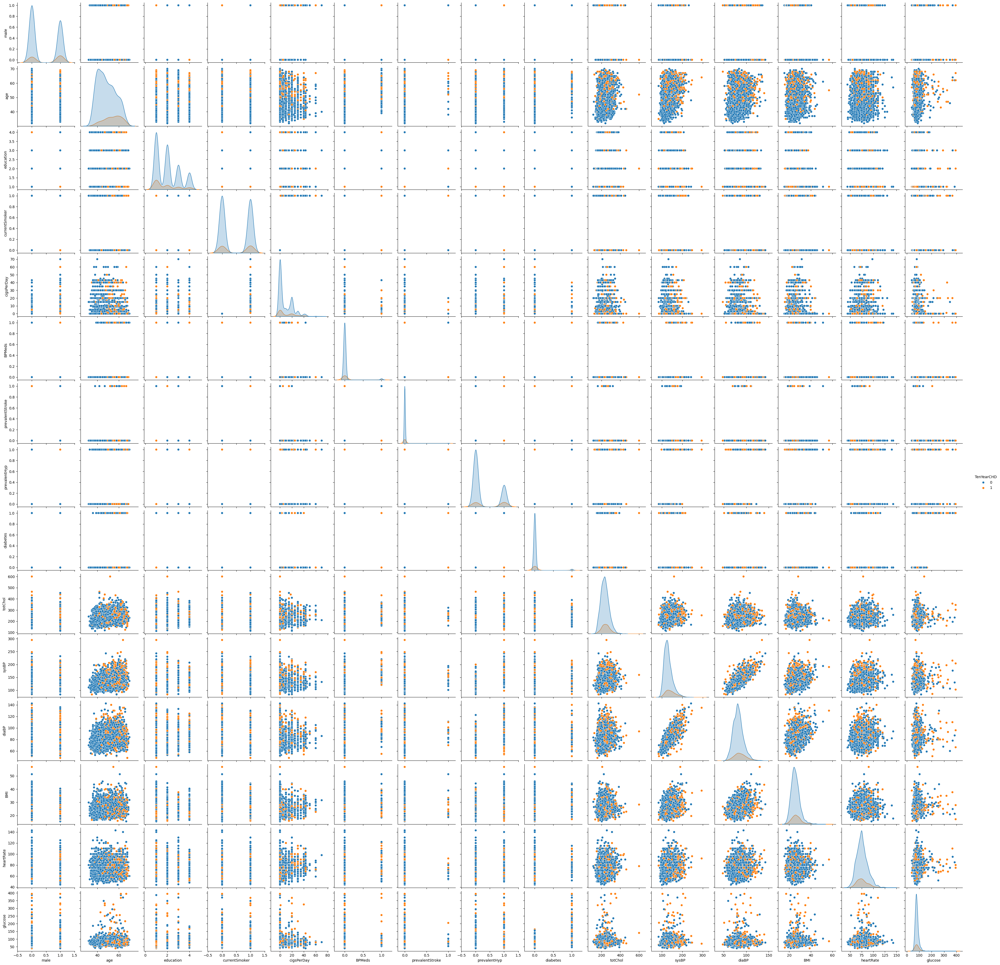

In [25]:
sns.pairplot(df,hue='TenYearCHD')

In [26]:
X = df.drop(columns=['TenYearCHD'])
y = df[['TenYearCHD']]
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)


In [27]:
lr = LogisticRegression()
lr.fit(X_train,y_train)
lr

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [28]:
nb = GaussianNB()
nb.fit(X_train,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


GaussianNB()

In [29]:
y_pred_lr = lr.predict(X_test)
y_pred_nb = nb.predict(X_test)

In [30]:
## Accuracy

def evaluate(classifier,y_pred,y_test):
    print("Accuracy: ",accuracy_score(y_pred,y_test))
    print("Precision: ",precision_score(y_pred,y_test,average='weighted'))
    print("Recall: ",recall_score(y_pred,y_test,average='weighted'))
    print("F1 Score: ",f1_score(y_pred,y_test,average='weighted'))

print("********Logistic Regression********")
evaluate(lr,y_pred_lr,y_test)

print("********Naive Bayes********")
evaluate(nb,y_pred_nb,y_test)

********Logistic Regression********
Accuracy:  0.8456284153005464
Precision:  0.9826493148234227
Recall:  0.8456284153005464
F1 Score:  0.907676194999573
********Naive Bayes********
Accuracy:  0.8169398907103825
Precision:  0.8486755702084362
Recall:  0.8169398907103825
F1 Score:  0.8312361191454898


In [31]:
def plot_cm(model_name,y_pred,y_test):
    classes = [0,1]
    cm = confusion_matrix(y_test,y_pred)
    plt.imshow(cm,interpolation='nearest',cmap=plt.cm.Blues)
    plt.title(model_name)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks,classes)
    plt.yticks(tick_marks,classes)
    plt.colorbar()
    plt.ylabel('True Labels')
    plt.xlabel('Predicted Labels')


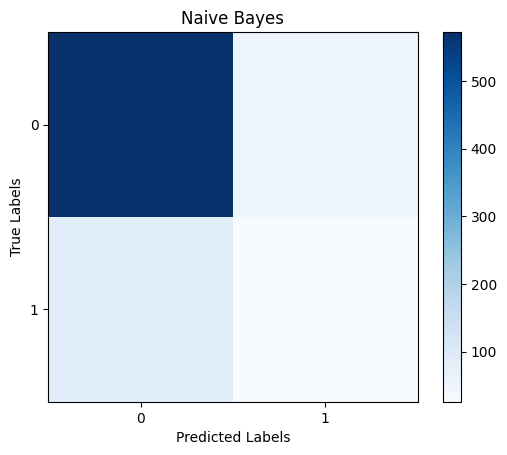

In [32]:
plot_cm('Naive Bayes',y_pred_nb,y_test)

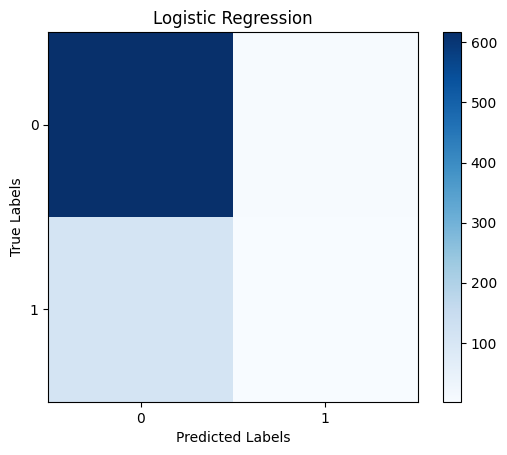

In [33]:
plot_cm('Logistic Regression',y_pred_lr,y_test)


## DecisionTree

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import *
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split
import seaborn as sns

In [35]:
df = pd.read_csv('Wine_dataset.csv')
df.tail(10)

,class,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280/OD315 of diluted wines,Proline
168,3,13.58,2.58,2.69,24.5,105,1.55,0.84,0.39,1.54,8.660000,0.74,1.80,750
169,3,13.40,4.60,2.86,25.0,112,1.98,0.96,0.27,1.11,8.500000,0.67,1.92,630
170,3,12.20,3.03,2.32,19.0,96,1.25,0.49,0.40,0.73,5.500000,0.66,1.83,510
171,3,12.77,2.39,2.28,19.5,86,1.39,0.51,0.48,0.64,9.899999,0.57,1.63,470
172,3,14.16,2.51,2.48,20.0,91,1.68,0.70,0.44,1.24,9.700000,0.62,1.71,660
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.700000,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.300000,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.200000,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.300000,0.60,1.62,840
177,3,14.13,4.10,2.74,24.5,96,2.05,0.76,0.56,1.35,9.200000,0.61,1.60,560


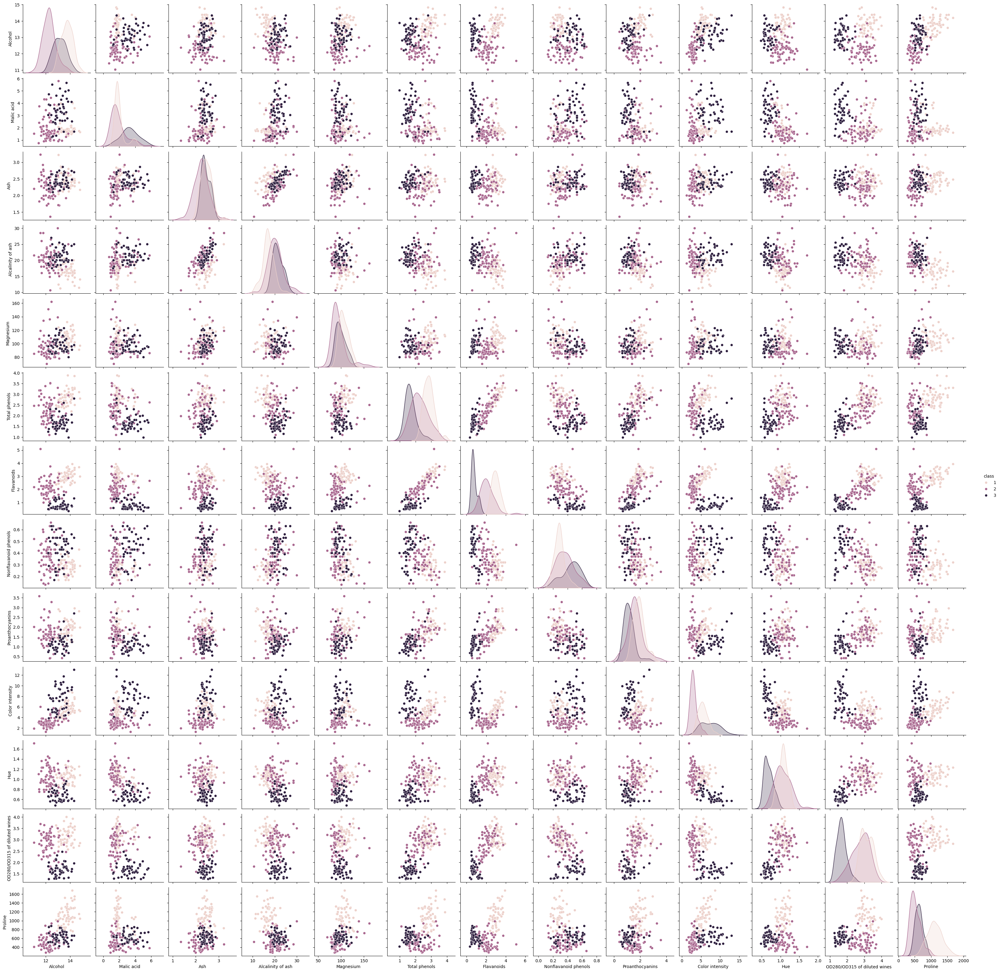

In [36]:
sns.pairplot(df,hue='class')

<Axes: xlabel='class', ylabel='count'>

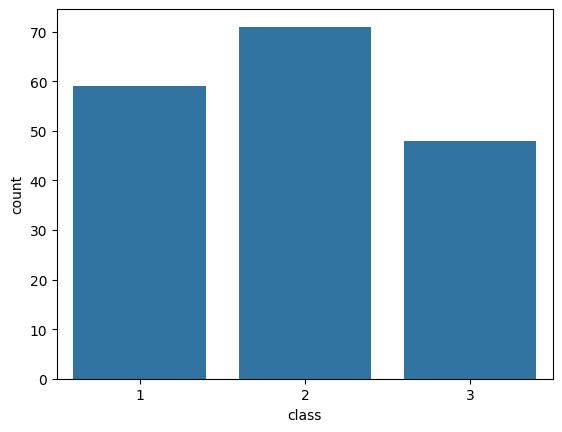

In [37]:
sns.countplot(x='class',data=df)

In [38]:
X = df.drop(columns=['class'])
y = df['class']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

sns.boxplot(X)

[Text(0.4444444444444444, 0.875, 'Flavanoids <= 2.31\nentropy = 1.559\nsamples = 142\nvalue = [52, 55, 35]\nclass = 2'),
 Text(0.2222222222222222, 0.625, 'Color intensity <= 3.825\nentropy = 0.994\nsamples = 77\nvalue = [0, 42, 35]\nclass = 2'),
 Text(0.1111111111111111, 0.375, 'entropy = 0.0\nsamples = 38\nvalue = [0, 38, 0]\nclass = 2'),
 Text(0.3333333333333333, 0.375, 'Flavanoids <= 1.4\nentropy = 0.477\nsamples = 39\nvalue = [0, 4, 35]\nclass = 3'),
 Text(0.2222222222222222, 0.125, 'entropy = 0.0\nsamples = 35\nvalue = [0, 0, 35]\nclass = 3'),
 Text(0.4444444444444444, 0.125, 'entropy = 0.0\nsamples = 4\nvalue = [0, 4, 0]\nclass = 2'),
 Text(0.6666666666666666, 0.625, 'Proline  <= 679.0\nentropy = 0.722\nsamples = 65\nvalue = [52, 13, 0]\nclass = 1'),
 Text(0.5555555555555556, 0.375, 'entropy = 0.0\nsamples = 12\nvalue = [0, 12, 0]\nclass = 2'),
 Text(0.7777777777777778, 0.375, 'Alcalinity of ash <= 27.5\nentropy = 0.135\nsamples = 53\nvalue = [52, 1, 0]\nclass = 1'),
 Text(0.6666

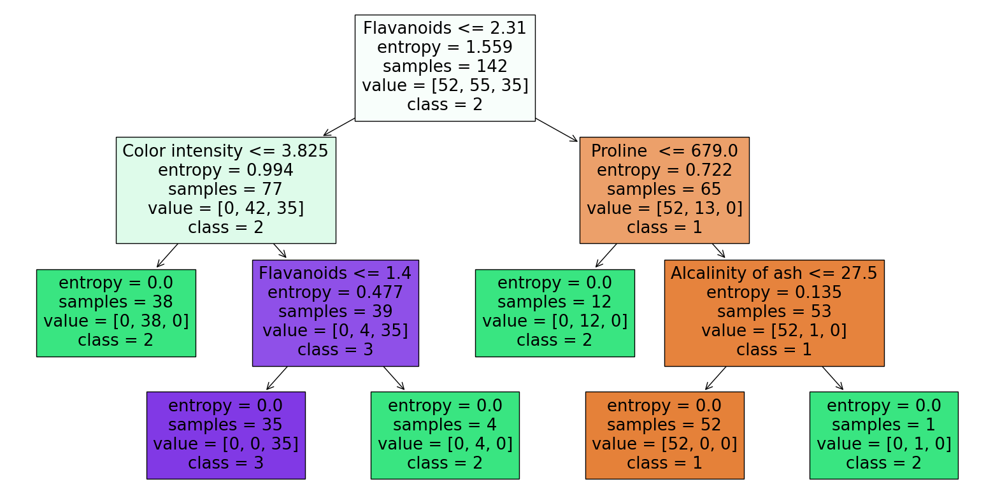

In [39]:
id3 = DecisionTreeClassifier(criterion='entropy',random_state=42)
id3.fit(X_train,y_train)
plt.figure(figsize=(20, 10))
plot_tree(id3,feature_names=X_train.columns.tolist(),class_names=['1','2','3'],filled=True)

In [40]:
y_pred_id3 = id3.predict(X_test)
preds = pd.DataFrame({'Actual Class':y_test.values.flatten(),'Predicted Class':y_pred_id3.flatten()})
preds

In [42]:
print('Metrics\n')
accuracy_id3 = accuracy_score(y_test, y_pred_id3)
precision_id3 = precision_score(y_test, y_pred_id3, average='weighted')
recall_id3 = recall_score(y_test, y_pred_id3, average='weighted')
f1_id3 = f1_score(y_test, y_pred_id3, average='weighted')
print("Accuracy:", accuracy_id3)
print("Precision:", precision_id3)
print("Recall:", recall_id3)
print("F1 Score:", f1_id3)

Metrics

Accuracy: 0.8888888888888888
Precision: 0.8958333333333334
Recall: 0.8888888888888888
F1 Score: 0.8911111111111111


[Text(0.5416666666666666, 0.9, 'Proline  <= 875.0\ngini = 0.655\nsamples = 142\nvalue = [52, 55, 35]\nclass = 2'),
 Text(0.3333333333333333, 0.7, 'Color intensity <= 3.825\ngini = 0.54\nsamples = 92\nvalue = [6, 52, 34]\nclass = 2'),
 Text(0.16666666666666666, 0.5, 'Ash <= 3.07\ngini = 0.043\nsamples = 45\nvalue = [1, 44, 0]\nclass = 2'),
 Text(0.08333333333333333, 0.3, 'gini = 0.0\nsamples = 44\nvalue = [0, 44, 0]\nclass = 2'),
 Text(0.25, 0.3, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0]\nclass = 1'),
 Text(0.5, 0.5, 'Flavanoids <= 1.4\ngini = 0.436\nsamples = 47\nvalue = [5, 8, 34]\nclass = 3'),
 Text(0.4166666666666667, 0.3, 'gini = 0.0\nsamples = 34\nvalue = [0, 0, 34]\nclass = 3'),
 Text(0.5833333333333334, 0.3, 'Proline  <= 679.0\ngini = 0.473\nsamples = 13\nvalue = [5, 8, 0]\nclass = 2'),
 Text(0.5, 0.1, 'gini = 0.0\nsamples = 8\nvalue = [0, 8, 0]\nclass = 2'),
 Text(0.6666666666666666, 0.1, 'gini = 0.0\nsamples = 5\nvalue = [5, 0, 0]\nclass = 1'),
 Text(0.75, 0.7, 'Color intens

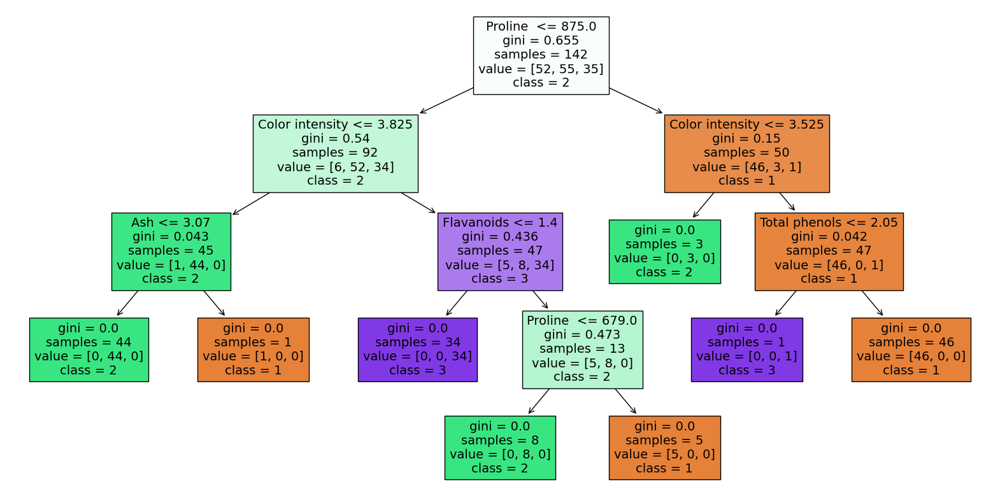

In [44]:
cart = DecisionTreeClassifier(criterion='gini')
cart.fit(X_train,y_train)

plt.figure(figsize=(20,10))
plot_tree(cart,feature_names=X_train.columns.tolist(),class_names=['1','2','3'],filled=True)


In [45]:
y_pred_cart = cart.predict(X_test)
cart_pred = pd.DataFrame({'Actual Class':y_test.values.flatten(),'Predicted Class':y_pred_cart.flatten()})
cart_pred

,Actual Class,Predicted Class
0,2,2
1,2,2
2,3,3
3,3,3
4,1,1
5,3,3
6,2,2
7,2,2
8,2,1
9,3,3


In [46]:
# Calculate metrics for CART decision tree
accuracy_cart = accuracy_score(y_test, y_pred_cart)
precision_cart = precision_score(y_test, y_pred_cart, average='weighted')
recall_cart = recall_score(y_test, y_pred_cart, average='weighted')
f1_cart = f1_score(y_test, y_pred_cart, average='weighted')
print("CART Decision Tree Metrics:")
print("Accuracy:", accuracy_cart)
print("Precision:", precision_cart)
print("Recall:", recall_cart)
print("F1 Score:", f1_cart)

CART Decision Tree Metrics:
Accuracy: 0.9166666666666666
Precision: 0.9199346405228758
Recall: 0.9166666666666666
F1 Score: 0.9173737373737375


## Clustering

In [49]:
!pip install scikit-learn-extra

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 8.2 MB/s eta 0:00:00


In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import rand_score,silhouette_score,davies_bouldin_score,adjusted_rand_score
import seaborn as sns

In [51]:
df = pd.read_csv('Seed_Data.csv')
df

,A,P,C,LK,WK,A_Coef,LKG,target
0,15.26,14.84,0.8710,5.763,3.312,2.221,5.220,0
1,14.88,14.57,0.8811,5.554,3.333,1.018,4.956,0
2,14.29,14.09,0.9050,5.291,3.337,2.699,4.825,0
3,13.84,13.94,0.8955,5.324,3.379,2.259,4.805,0
4,16.14,14.99,0.9034,5.658,3.562,1.355,5.175,0
...,...,...,...,...,...,...,...,...
205,12.19,13.20,0.8783,5.137,2.981,3.631,4.870,2
206,11.23,12.88,0.8511,5.140,2.795,4.325,5.003,2
207,13.20,13.66,0.8883,5.236,3.232,8.315,5.056,2
208,11.84,13.21,0.8521,5.175,2.836,3.598,5.044,2


In [52]:
df.isna().sum()

A         0
P         0
C         0
LK        0
WK        0
A_Coef    0
LKG       0
target    0
dtype: int64

In [ ]:
sns.pairplot(df)

In [53]:
k = [3,5,7]

for i in k:
    kmeans = KMeans(n_clusters=i,random_state=0)
    kmeans.fit(df)
    df['k_means_'+str(i)] = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [54]:
for i in k:
    kmedoids = KMedoids(n_clusters=i,random_state=0)
    kmedoids.fit(df)
    df['k_medoids_'+str(i)] = kmedoids.labels_

In [55]:
df.head(10)

,A,P,C,LK,WK,A_Coef,LKG,target,k_means_3,k_means_5,k_means_7,k_medoids_3,k_medoids_5,k_medoids_7
0,15.26,14.84,0.8710,5.763,3.312,2.221,5.220,0,0,0,3,2,3,2
1,14.88,14.57,0.8811,5.554,3.333,1.018,4.956,0,0,0,3,2,3,2
2,14.29,14.09,0.9050,5.291,3.337,2.699,4.825,0,0,4,0,1,4,1
3,13.84,13.94,0.8955,5.324,3.379,2.259,4.805,0,0,4,0,1,4,1
4,16.14,14.99,0.9034,5.658,3.562,1.355,5.175,0,0,0,3,0,3,2
5,14.38,14.21,0.8951,5.386,3.312,2.462,4.956,0,0,4,0,1,4,1
6,14.69,14.49,0.8799,5.563,3.259,3.586,5.219,0,0,0,3,2,3,2
7,14.11,14.10,0.8911,5.420,3.302,2.700,5.000,0,0,4,0,1,4,1
8,16.63,15.46,0.8747,6.053,3.465,2.040,5.877,0,0,0,3,0,3,2
9,16.44,15.25,0.8880,5.884,3.505,1.969,5.533,0,0,0,3,0,3,2


K Means Clustering


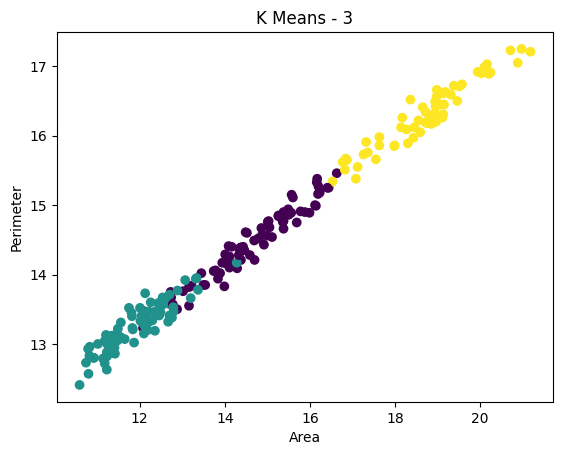


Silhouette Score 0.40081942783856433
Rand Score 0.9070858965595807
Adjusted Rand Score 0.7903760629357317
Davies Bouldin Score 1.242851564840591


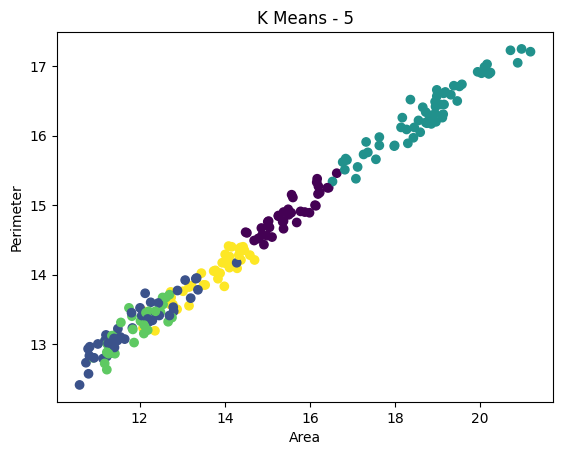


Silhouette Score 0.546456444439657
Rand Score 0.8371838687628161
Adjusted Rand Score 0.5935788509505567
Davies Bouldin Score 0.7587621347703148


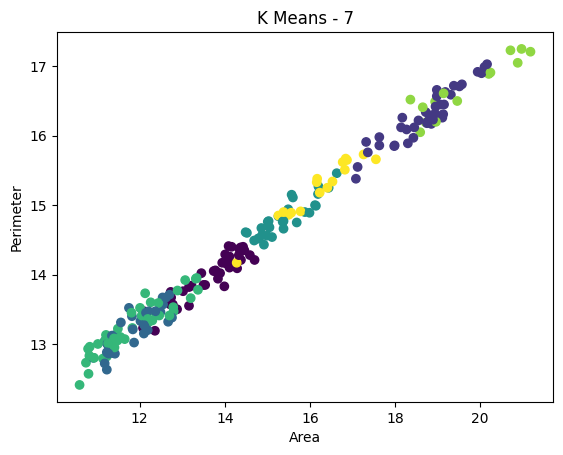


Silhouette Score 0.5862528611132851
Rand Score 0.8015493278651173
Adjusted Rand Score 0.48138130421182
Davies Bouldin Score 0.7286317669840386


In [56]:
print("K Means Clustering")
for i in k:
    plt.scatter(df['A'],df['P'],c=df['k_means_'+str(i)])
    plt.xlabel('Area')
    plt.ylabel('Perimeter')
    plt.title('K Means - '+str(i))
    plt.show()
    print()
    print('Silhouette Score',silhouette_score(df,df['k_means_'+str(i)]))
    print('Rand Score',rand_score(df['target'],df['k_means_'+str(i)]))
    print('Adjusted Rand Score',adjusted_rand_score(df['target'],df['k_means_'+str(i)]))
    print('Davies Bouldin Score',davies_bouldin_score(df,df['k_means_'+str(i)]))

K Medoids Clustering


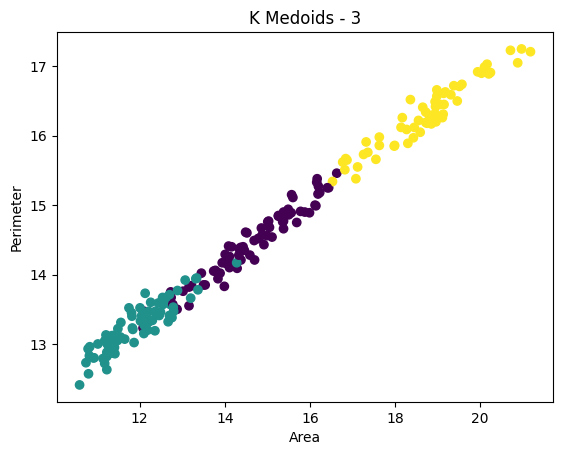


Silhouette Score 0.39777341149006484
Rand Score 0.7450444292549556
Adjusted Rand Score 0.43652249587639447
Davies Bouldin Score 1.019372723921917


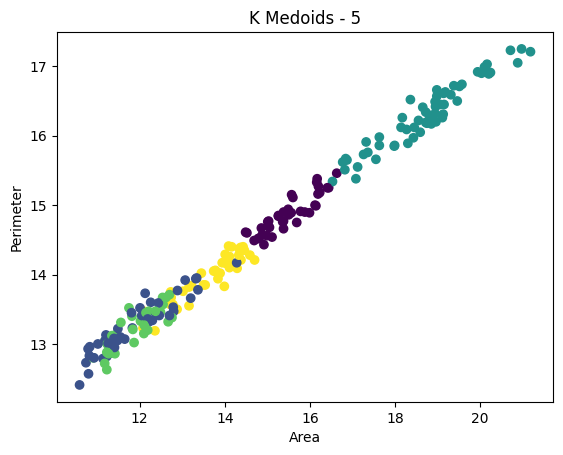


Silhouette Score 0.44097287881419034
Rand Score 0.8417407154249259
Adjusted Rand Score 0.6152131031437346
Davies Bouldin Score 0.8805660682137104


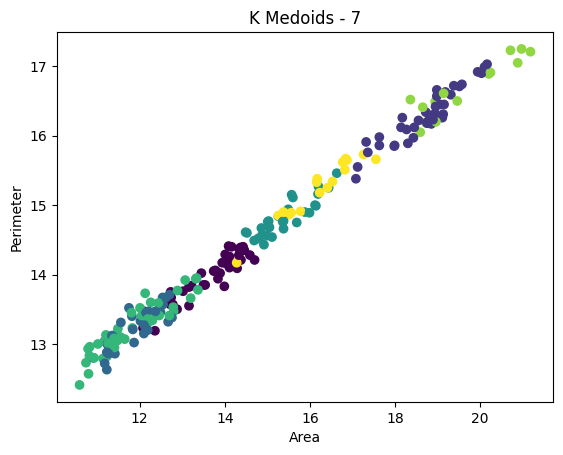


Silhouette Score 0.5678581394650486
Rand Score 0.8087035771246297
Adjusted Rand Score 0.5103583598510173
Davies Bouldin Score 0.6245379907608243


In [57]:
print("K Medoids Clustering")
for i in k:
    plt.scatter(df['A'],df['P'],c=df['k_means_'+str(i)])
    plt.xlabel('Area')
    plt.ylabel('Perimeter')
    plt.title('K Medoids - '+str(i))
    plt.show()
    print()
    print('Silhouette Score',silhouette_score(df,df['k_medoids_'+str(i)]))
    print('Rand Score',rand_score(df['target'],df['k_medoids_'+str(i)]))
    print('Adjusted Rand Score',adjusted_rand_score(df['target'],df['k_medoids_'+str(i)]))
    print('Davies Bouldin Score',davies_bouldin_score(df,df['k_medoids_'+str(i)]))

## Hierarchial Clustering and DBSCAN

In [58]:
h = AgglomerativeClustering(n_clusters=5)
dbscan = DBSCAN(eps=0.5,min_samples=5)

In [60]:
df = pd.read_csv('Mall_Customers.csv')
df

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40
...,...,...,...,...,...
195,196,Female,35,120,79
196,197,Female,45,126,28
197,198,Male,32,126,74
198,199,Male,32,137,18


In [61]:
X = df.iloc[:,[3,4]].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [62]:
h_cluster = h.fit_predict(X_scaled)
dbscan_cluster = dbscan.fit_predict(X_scaled)

In [63]:
print("Hierarchial Clustering")
print("Silhouette Score: ",silhouette_score(X,h_cluster))
print("Davies Bouldin Score: ",davies_bouldin_score(X,h_cluster))

Hierarchial Clustering
Silhouette Score:  0.5529945955148897
Davies Bouldin Score:  0.5782207452369453


In [64]:
print("DBSCAN Clustering")
print("Silhouette Score: ",silhouette_score(X,dbscan_cluster))
print("Davies Bouldin Score: ",davies_bouldin_score(X,dbscan_cluster))

DBSCAN Clustering
Silhouette Score:  0.35070898426844344
Davies Bouldin Score:  0.8222341115673952


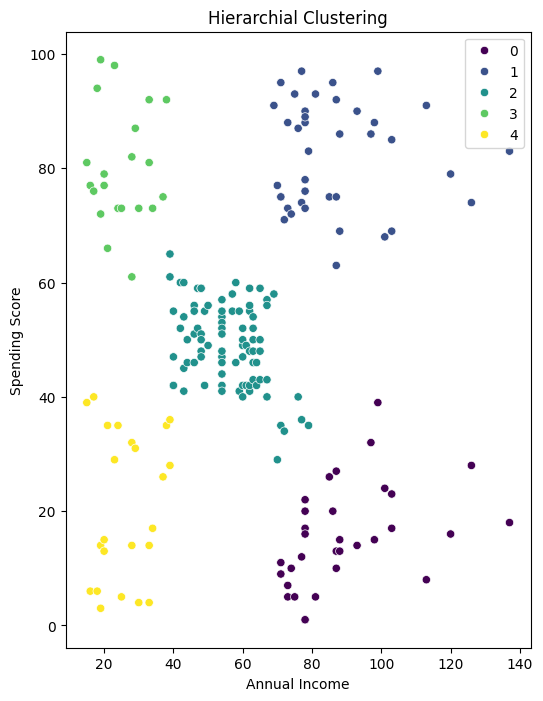

In [65]:
plt.figure(figsize=(6,8))
sns.scatterplot(x=X[:,0],y=X[:,1],hue=h_cluster,palette="viridis")
plt.title("Hierarchial Clustering")
plt.xlabel("Annual Income")
plt.ylabel("Spending Score")
plt.show()

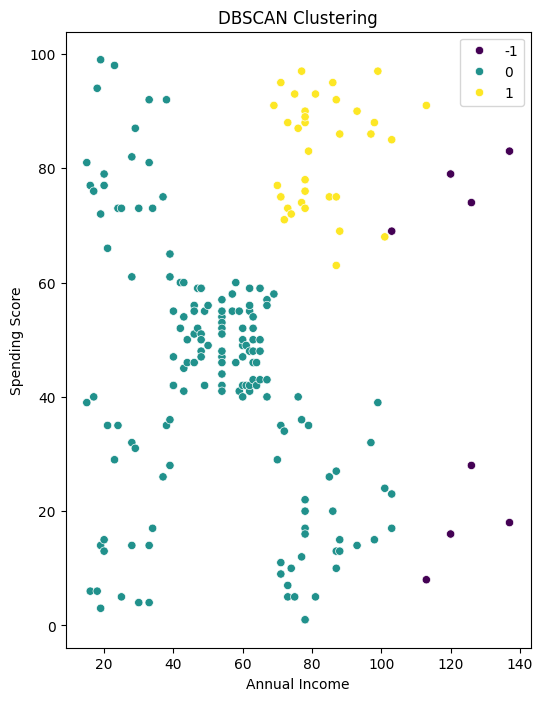

In [66]:
plt.figure(figsize=(6,8))
sns.scatterplot(x=X[:,0],y=X[:,-1],hue=dbscan_cluster,palette="viridis")
plt.title("DBSCAN Clustering")
plt.xlabel("Annual Income")
plt.ylabel("Spending Score")
plt.show()

### LAB ASSESSMENT -1

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
import statsmodels.api as sm

In [ ]:
df = pd.read_csv('forestfires.csv')
df.head(1000)

In [ ]:
def simple_linear_regression_fires(df):
    df = df.dropna()
    X = df[["temp"]]

    y = df["area"]
    print(y)

    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

    model = LinearRegression()

    model.fit(X_train,y_train)

    print('Simple Linear Regression Results\n')

    print('Coefficient: ',model.coef_[0])
    print('Intercept: ',model.intercept_)

    y_pred = model.predict(X_test)

    mse = metrics.mean_squared_error(y_test, y_pred)
    r2 = metrics.r2_score(y_test, y_pred)

    print("Mean Squared Error: ", mse)
    print("r2: ",r2)

    df2 = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
    print(df2)



    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.scatterplot(x=X_train['temp'], y=y_train, color='blue', label='Actual')
    sns.lineplot(x=X_test['temp'], y=y_pred, color='red', label='Regression Line')
    plt.title('Scatterplot and Regression Plot')
    plt.xlabel('Temperature')
    plt.ylabel('Area')
    plt.legend()

simple_linear_regression_fires(df)

In [ ]:
def multiple_linear_regression_fires(data):
     df = pd.read_csv(data)
     X = df[['temp', 'RH', 'wind']]
     y = df['area']

     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

     model = LinearRegression()

     model.fit(X_train, y_train)

     y_pred = model.predict(X_test)

     mse = metrics.mean_squared_error(y_test, y_pred)
     r2 = metrics.r2_score(y_test, y_pred)

     print("Multiple Linear Regression Results\n")

     print("Coefficient: ",model.coef_[0])
     print('Intercept: ',model.intercept_)

     print('Mean Squared Error: ',mse)
     print('R-squared: ',r2)

     df2 = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
     print(df2)

     plt.figure(figsize=(10,14))
     sns.heatmap(df[['temp','RH','wind','area']].corr(),annot=True)

  multiple_linear_regression_fires('forestfires.csv')

## LAB ASSESSMENT 2

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.tree import export_text


In [ ]:
df = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

In [ ]:
#Remove missing values

df = df.dropna()
df.isna()

In [ ]:
# Encoding categorical variables

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['Sex'] = le.fit_transform(df['Sex'])
df['Ticket'] = le.fit_transform(df['Ticket'])
df['Cabin'] = le.fit_transform(df['Cabin'])
df['Embarked'] = le.fit_transform(df['Embarked'])


df.head(100)


In [ ]:
sns.pairplot(data=df,hue='Survived')

In [ ]:
# Preparing the testing dataset

#df_test = df_test.drop(columns = ['Cabin'])
df_test = df_test.dropna()
df_test['Cabin'] = le.fit_transform(df_test['Cabin'])

df_test['Sex'] = le.fit_transform(df_test['Sex'])
df_test['Ticket'] = le.fit_transform(df_test['Ticket'])
df_test['Embarked'] = le.fit_transform(df_test['Embarked'])

In [ ]:
X_train = df.drop(columns = ['Survived','Name'])
y_train = df['Survived']


X_test = df_test.drop(columns = ['Survived','Name'])
y_test = df_test['Survived']

In [ ]:
clf = DecisionTreeClassifier(criterion='entropy', random_state=42)
clf.fit(X_train, y_train)


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
y_pred = clf.predict(X_test)

# Calculate metrics for ID3 decision tree
accuracy_id3 = accuracy_score(y_test, y_pred)
precision_id3 = precision_score(y_test, y_pred, average='weighted')
recall_id3 = recall_score(y_test, y_pred, average='weighted')
f1_id3 = f1_score(y_test, y_pred, average='weighted')

print("Decision Tree Metrics:")
print("Accuracy:", accuracy_id3)
print("Precision:", precision_id3)
print("Recall:", recall_id3)
print("F1 Score:", f1_id3)

In [ ]:
# Visualize the decision tree using text representation
tree_rules = export_text(clf, feature_names=X_train.columns.tolist())
print(tree_rules)


# Visualize the decision tree
plt.figure(figsize=(40, 20))
plot_tree(clf, feature_names=X_train.columns.tolist(), class_names=['0','1'], filled=True) #Here class names are the possible values of Survived column that is either 0 (not survived) or 1(survived)

## LAB - 1

In [ ]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
from geopandas import GeoDataFrame
import geopandas as gpd
from shapely.geometry import Point
import folium

In [ ]:
file="Bias_correction_ucl.csv"
df = pd.read_csv(file)

In [ ]:
def dataexplore():
    file="Bias_correction_ucl.csv"
    df = pd.read_csv(file)
    print("1. Load Data")
    print("2. Display the dimension, shape, size and attributes type")
    print("3. Display the first few rows")
    print("4. Provide summary statistics for key features.")
    print("5. Identify and handle any missing values or outliers.")
    choice = int(input("Enter your choice: "))
    if choice == 1:
        df = pd.read_csv(file)
    elif choice == 2:
        print("Size: ",df.size)
        print("Shape: ",df.shape)
        print("Dimension: ",df.ndim)
        print("Attributes: ",df.dtypes)
    elif choice == 3:
        print(df.head(10))
    elif choice == 4:
        print(df.describe())
    elif choice == 5:
        print("Before Dropping Missing Values")
        df_copy = df
        print(df)
        print("After Dropping Missing Values")
        df_copy.dropna()
        print(df_copy)
    else:
        print("Invalid Choice")

In [ ]:
def temporalanalysis():
    file="Bias_correction_ucl.csv"
    df = pd.read_csv(file)
    print("1. Explore the temporal aspect of the dataset. Are there any trends or patterns over time?")
    print("2. Visualize the variation in temperature (Present_Tmax and Present_Tmin) over different years.")
    ch = int(input("Enter your choice: "))
    if ch == 1:
       print(df[["Present_Tmax","Present_Tmin"]])
    elif ch == 2:
        df['Date'] = pd.to_datetime(df['Date'])
        df.set_index('Date', inplace=True)
        plt.figure(figsize=(12, 6))
        sn.lineplot(data=df[['Present_Tmax', 'Present_Tmin']])
        plt.title('Temperature Variation Over Time')
        plt.xlabel('Year')
        plt.ylabel('Temperature (°C)')
        plt.show()

In [ ]:
def geographicalanalysis():
    file="Bias_correction_ucl.csv"
    df = pd.read_csv(file)
    print("1. Explore the geographical features (lat, lon, DEM, Slope).")
    print("2. Visualize the distribution of weather stations on a map. ")
    print("3. Analyze how elevation (DEM) and slope impact temperature.")
    print("4. Enter your choice: ")
    choice = int(input("Enter your choice: "))
    if choice == 1:
        plt.figure(figsize=(12, 6))
        sn.pairplot(df[['lat', 'lon', 'DEM', 'Slope']])
        plt.suptitle('Geographical Features Analysis')
        plt.show()
    elif choice ==2:
        station_map = folium.Map(location=[df['lat'].mean(), df['lon'].mean()], zoom_start=12)
        for index, row in df.iterrows():
            folium.Marker([row['lat'], row['lon']], popup=f"Station {row['station']}").add_to(station_map)
        station_map.save('weather_stations_map.html')
    elif choice == 3:
        plt.figure(figsize=(12, 6))
        df_no_duplicates = df[['DEM', 'Present_Tmax', 'Present_Tmin']].drop_duplicates(subset='DEM')
        sn.scatterplot(x='DEM', y='Present_Tmax', data=df_no_duplicates, label='Present_Tmax')
        sn.scatterplot(x='DEM', y='Present_Tmin', data=df_no_duplicates, label='Present_Tmin')
        plt.title('Impact of Elevation on Temperature')
        plt.xlabel('Elevation (m)')
        plt.ylabel('Temperature (°C)')
        plt.legend()
        plt.show()
    else:
        print("Invalid Choice")

In [ ]:
def correlationanalysis():
    file="Bias_correction_ucl.csv"
    df = pd.read_csv(file)
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)
    print("1. Calculate and visualize the correlation matrix for numerical features.")
    print("2. Identify highly correlated features.")
    choice = int(input("Enter a choice: "))
    if choice == 1:
        correlation_matrix = df.corr()
        plt.figure(figsize=(12, 8))
        sn.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
        plt.title('Correlation Matrix')
        plt.show()
    elif choice == 2:
        correlation_matrix = df.corr()
        highly_correlated = correlation_matrix[(correlation_matrix.abs() > 0.7) & (correlation_matrix < 1.0)].dropna(how='all', axis=1)
        print("Highly correlated features:")
        print(highly_correlated)

        df_reset = df.reset_index()
        plt.figure(figsize=(10, 6))
        sn.scatterplot(x='Present_Tmin', y='LDAPS_Tmin_lapse', data=df_reset)
        plt.title('Scatter Plot: Present_Tmin vs LDAPS_Tmin_lapse')
        plt.xlabel('Present_Tmin (°C)')
        plt.ylabel('LDAPS_Tmin_lapse (°C)')
        plt.show()
        plt.figure(figsize=(10, 6))
        sn.scatterplot(x='LDAPS_Tmax_lapse', y='Next_Tmax', data=df_reset)
        plt.title('Scatter Plot: LDAPS_Tmax_lapse vs Next_Tmax')
        plt.xlabel('LDAPS_Tmax_lapse (°C)')
        plt.ylabel('Next_Tmax (°C)')
        plt.show()
    else:
        print("Invalid Choice")

In [ ]:
def featurespecificanalysis():
    print("1. Explore the LDAPS features (RH, Tmax_lapse, Tmin_lapse, WS, LH, CC, PPT).")
    print("2. Visualize the relationships between LDAPS features and other key variables.")
    print("3. Analyze the impact of cloud cover and precipitation on temperature.")
    print("4. Plot the individual box plot for all attributes except the date attribute")
    choice = int(input())
    if choice == 1:
        ldaps_features = df[['LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
                             'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']]

        plt.figure(figsize=(14, 10))
        sn.heatmap(ldaps_features.corr(), annot=True, cmap='coolwarm', fmt=".2f")
        plt.title('Correlation Matrix of LDAPS Features')
        plt.show()
    elif choice == 2:
        plt.figure(figsize=(14, 6))
        sn.boxplot(x='LDAPS_CC1', y='Present_Tmax', data=df)
        plt.title('Impact of LDAPS_CC1 on Present_Tmax')
        plt.xlabel('LDAPS_CC1')
        plt.ylabel('Present_Tmax (°C)')
        plt.show()
    elif choice == 3:
        plt.figure(figsize=(14, 6))
        sn.boxplot(x='LDAPS_PPT1', y='Present_Tmax', data=df)
        plt.title('Impact of LDAPS_PPT1 on Present_Tmax')
        plt.xlabel('LDAPS_PPT1')
        plt.ylabel('Present_Tmax (°C)')
        plt.show()

    elif choice == 4:
        attributes_to_plot = df.columns.difference(['Date'])
        plt.figure(figsize=(18, 12))
        sn.boxplot(data=df[attributes_to_plot])
        plt.title('Box Plots of Attributes')
        plt.xticks(rotation=45, ha='right')
        plt.show()
    else:
        print("Invalid Choice")

In [ ]:

while True:
    print("1. Data Exploration")
    print("2. Temporal Analysis")
    print("3. Geographical Analysis")
    print("4. Correlation Analysis")
    print("5. Feature-specific Analysis")
    print("6. Exit")
    choice = int(input("Enter your choice: "))
    if choice == 1:
        dataexplore()
    elif choice ==2:
        temporalanalysis()
    elif choice ==3:
        geographicalanalysis()
    elif choice == 4:
        correlationanalysis()
    elif choice ==5:
        featurespecificanalysis()
    elif choice == 6:
        break